In [1]:
import re
import numpy as np
import collections
from collections import Counter
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from bokeh.io import output_file, show
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, HoverTool
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import Perceptron
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier


In [2]:
train = pd.read_csv('../input/mbti_1.csv')

In [3]:
train.shape

(8675, 2)

In [4]:
train.head(10)

,type,posts
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...
1,ENTP,'I'm finding the lack of me in these posts ver...
2,INTP,'Good one _____ https://www.youtube.com/wat...
3,INTJ,"'Dear INTP, I enjoyed our conversation the o..."
4,ENTJ,'You're fired.|||That's another silly misconce...
5,INTJ,'18/37 @.@|||Science is not perfect. No scien...
6,INFJ,"'No, I can't draw on my own nails (haha). Thos..."
7,INTJ,'I tend to build up a collection of things on ...
8,INFJ,"I'm not sure, that's a good question. The dist..."
9,INTP,'https://www.youtube.com/watch?v=w8-egj0y8Qs||...


In [5]:
print(train['posts'][2])

'Good one  _____   https://www.youtube.com/watch?v=fHiGbolFFGw|||Of course, to which I say I know; that's my blessing and my curse.|||Does being absolutely positive that you and your best friend could be an amazing couple count? If so, than yes.   Or it's more I could be madly in love in case I reconciled my feelings (which at...|||No, I didn't; thank you for a link!|||So-called Ti-Si loop (and it can stem from any current topic/obsession) can be deadly. It's like when you're stuck in your own thoughts, and your mind just wanders in circles. Feels truly terrible. ...|||Have you noticed how peculiar vegetation can be? All you have to do is look down at the grass: dozens of different plant species there.    And now imagine that hundreds of years later (when/if soil...|||The Smiths – Never Had No One Ever|||I often find myself spotting faces on marble tiles/wood.|||This 5 year-old sentence is an incredibly accurate and beautiful description.|||I haven't visited this website in the last 3 

In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8675 entries, 0 to 8674
Data columns (total 2 columns):
type     8675 non-null object
posts    8675 non-null object
dtypes: object(2)
memory usage: 135.7+ KB


In [7]:
train['nroWords'] = train['posts'].apply(lambda x: len(x.split()))

In [8]:
train.head()

,type,posts,nroWords
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,556
1,ENTP,'I'm finding the lack of me in these posts ver...,1170
2,INTP,'Good one _____ https://www.youtube.com/wat...,836
3,INTJ,"'Dear INTP, I enjoyed our conversation the o...",1064
4,ENTJ,'You're fired.|||That's another silly misconce...,967


In [9]:
del train['nroWords']

In [10]:
[p.split('|||') for p in train.head(2).posts.values]

[["'http://www.youtube.com/watch?v=qsXHcwe3krw",
  'http://41.media.tumblr.com/tumblr_lfouy03PMA1qa1rooo1_500.jpg',
  'enfp and intj moments  https://www.youtube.com/watch?v=iz7lE1g4XM4  sportscenter not top ten plays  https://www.youtube.com/watch?v=uCdfze1etec  pranks',
  'What has been the most life-changing experience in your life?',
  'http://www.youtube.com/watch?v=vXZeYwwRDw8   http://www.youtube.com/watch?v=u8ejam5DP3E  On repeat for most of today.',
  'May the PerC Experience immerse you.',
  'The last thing my INFJ friend posted on his facebook before committing suicide the next day. Rest in peace~   http://vimeo.com/22842206',
  "Hello ENFJ7. Sorry to hear of your distress. It's only natural for a relationship to not be perfection all the time in every moment of existence. Try to figure the hard times as times of growth, as...",
  '84389  84390  http://wallpaperpassion.com/upload/23700/friendship-boy-and-girl-wallpaper.jpg  http://assets.dornob.com/wp-content/uploads/2010/04

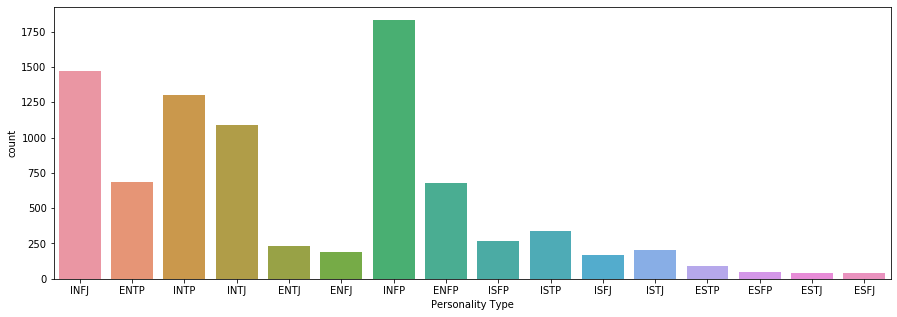

In [11]:
plt.figure(figsize=(15,5))
fig = sns.countplot(train.loc[:, 'type'])
plt.xlabel('Personality Type')
plt.ylabel('count')
plt.show(fig)

In [12]:
unique_type_list = ['INFJ', 'ENTP', 'INTP', 'INTJ', 'ENTJ', 'ENFJ', 'INFP', 'ENFP',
       'ISFP', 'ISTP', 'ISFJ', 'ISTJ', 'ESTP', 'ESFP', 'ESTJ', 'ESFJ']
lab_encoder = LabelEncoder().fit(unique_type_list)

In [13]:
#type_list

In [14]:
#import time
##### Compute list of subject with Type | list of comments 

# Time
#%time train.posts[1].replace('+', ' ').replace('.', ' ').replace(',', ' ').replace(':', ' ')
train.posts[1].replace('+', ' ').replace('.', ' ').replace(',', ' ').replace(':', ' ')
#%time re.sub('http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|(?:%[0-9a-fA-F][0-9a-fA-F]))+', '', train.posts[1])
re.sub('http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|(?:%[0-9a-fA-F][0-9a-fA-F]))+', '', train.posts[1])

"'I'm finding the lack of me in these posts very alarming.|||Sex can be boring if it's in the same position often. For example me and my girlfriend are currently in an environment where we have to creatively use cowgirl and missionary. There isn't enough...|||Giving new meaning to 'Game' theory.|||Hello *ENTP Grin*  That's all it takes. Than we converse and they do most of the flirting while I acknowledge their presence and return their words with smooth wordplay and more cheeky grins.|||This + Lack of Balance and Hand Eye Coordination.|||Real IQ test I score 127. Internet IQ tests are funny. I score 140s or higher.  Now, like the former responses of this thread I will mention that I don't believe in the IQ test. Before you banish...|||You know you're an ENTP when you vanish from a site for a year and a half, return, and find people are still commenting on your posts and liking your ideas/thoughts. You know you're an ENTP when you...|||||||||I over think things sometimes. I go by the o

In [15]:
from nltk.corpus import stopwords 
from nltk import word_tokenize
from nltk.stem import PorterStemmer, WordNetLemmatizer

# Lemmatizer | Stemmatizer
stemmer = PorterStemmer()
lemmatiser = WordNetLemmatizer()



In [16]:
# Cache the stop words for speed 
cachedStopWords = stopwords.words("english")

# One post
OnePost = train.posts[1]

# List all urls
urls = re.findall('http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|(?:%[0-9a-fA-F][0-9a-fA-F]))+', OnePost)

# Remove urls
temp = re.sub('http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|(?:%[0-9a-fA-F][0-9a-fA-F]))+', 'link', OnePost)


In [17]:
OnePost

"'I'm finding the lack of me in these posts very alarming.|||Sex can be boring if it's in the same position often. For example me and my girlfriend are currently in an environment where we have to creatively use cowgirl and missionary. There isn't enough...|||Giving new meaning to 'Game' theory.|||Hello *ENTP Grin*  That's all it takes. Than we converse and they do most of the flirting while I acknowledge their presence and return their words with smooth wordplay and more cheeky grins.|||This + Lack of Balance and Hand Eye Coordination.|||Real IQ test I score 127. Internet IQ tests are funny. I score 140s or higher.  Now, like the former responses of this thread I will mention that I don't believe in the IQ test. Before you banish...|||You know you're an ENTP when you vanish from a site for a year and a half, return, and find people are still commenting on your posts and liking your ideas/thoughts. You know you're an ENTP when you...|||http://img188.imageshack.us/img188/6422/6020d1f9da

In [18]:
urls

['http://img188.imageshack.us/img188/6422/6020d1f9da6944a6b71bbe6.jpg',
 'http://img.adultdvdtalk.com/813a0c6243814cab84c51',
 'http://i817.photobucket.com/albums/zz96/kamioo/Dirtywinch.png',
 'http://i817.photobucket.com/albums/zz96/kamioo/Thunderstorm.pnghttp://i817.photobucket.com/albums/zz96/kamioo/Thunderstormbw.png',
 'http://i817.photobucket.com/albums/zz96/kamioo/Cosmicstorm.png',
 'http://www.youtube.com/watch?v=j5W73HaVQBg',
 'http://i817.photobucket.com/albums/zz96/kamioo/Deathgrip.png',
 'http://i817.photobucket.com/albums/zz96/kamioo/Deathgripbw.png',
 'http://i817.photobucket.com/albums/zz96/kamioo/Statickitten.png']

In [19]:
temp

"'I'm finding the lack of me in these posts very alarming.|||Sex can be boring if it's in the same position often. For example me and my girlfriend are currently in an environment where we have to creatively use cowgirl and missionary. There isn't enough...|||Giving new meaning to 'Game' theory.|||Hello *ENTP Grin*  That's all it takes. Than we converse and they do most of the flirting while I acknowledge their presence and return their words with smooth wordplay and more cheeky grins.|||This + Lack of Balance and Hand Eye Coordination.|||Real IQ test I score 127. Internet IQ tests are funny. I score 140s or higher.  Now, like the former responses of this thread I will mention that I don't believe in the IQ test. Before you banish...|||You know you're an ENTP when you vanish from a site for a year and a half, return, and find people are still commenting on your posts and liking your ideas/thoughts. You know you're an ENTP when you...|||link|||link|||I over think things sometimes. I go 

In [20]:
# Keep only words
temp = re.sub("[^a-zA-Z]", " ", temp)

# Remove spaces > 1
temp = re.sub(' +', ' ', temp).lower()

# Remove stopwords and lematize
%time stemmer.stem(" ".join([w for w in temp.split(' ') if w not in cachedStopWords]))

print("\nBefore preprocessing:\n\n", OnePost[0:1000])
print("\nAfter preprocessing:\n\n", temp[0:1000])
print("\nList of urls:")
urls

CPU times: user 1.79 ms, sys: 299 µs, total: 2.09 ms
Wall time: 1.81 ms

Before preprocessing:

 'I'm finding the lack of me in these posts very alarming.|||Sex can be boring if it's in the same position often. For example me and my girlfriend are currently in an environment where we have to creatively use cowgirl and missionary. There isn't enough...|||Giving new meaning to 'Game' theory.|||Hello *ENTP Grin*  That's all it takes. Than we converse and they do most of the flirting while I acknowledge their presence and return their words with smooth wordplay and more cheeky grins.|||This + Lack of Balance and Hand Eye Coordination.|||Real IQ test I score 127. Internet IQ tests are funny. I score 140s or higher.  Now, like the former responses of this thread I will mention that I don't believe in the IQ test. Before you banish...|||You know you're an ENTP when you vanish from a site for a year and a half, return, and find people are still commenting on your posts and liking your ideas/th

['http://img188.imageshack.us/img188/6422/6020d1f9da6944a6b71bbe6.jpg',
 'http://img.adultdvdtalk.com/813a0c6243814cab84c51',
 'http://i817.photobucket.com/albums/zz96/kamioo/Dirtywinch.png',
 'http://i817.photobucket.com/albums/zz96/kamioo/Thunderstorm.pnghttp://i817.photobucket.com/albums/zz96/kamioo/Thunderstormbw.png',
 'http://i817.photobucket.com/albums/zz96/kamioo/Cosmicstorm.png',
 'http://www.youtube.com/watch?v=j5W73HaVQBg',
 'http://i817.photobucket.com/albums/zz96/kamioo/Deathgrip.png',
 'http://i817.photobucket.com/albums/zz96/kamioo/Deathgripbw.png',
 'http://i817.photobucket.com/albums/zz96/kamioo/Statickitten.png']

In [21]:
##### Compute list of subject with Type | list of comments 
from nltk.stem import PorterStemmer, WordNetLemmatizer

# Lemmatize
stemmer = PorterStemmer()
lemmatiser = WordNetLemmatizer()


In [22]:
#sample = train.iloc[0:10,:]

In [23]:
#sample.head()

In [24]:
#sample.shape

In [25]:

def pre_process_data(data, remove_stop_words=True):

    list_personality = []
    list_posts = []
    len_data = len(data)
    i=0
    
    for index, row in data.iterrows():
        i+=1
        if i % 500 == 0:
            print("%s | %s rows" % (i, len_data))

        ##### Remove and clean comments
        #posts = row[1].posts
        posts = row['posts']
        temp = re.sub('http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|(?:%[0-9a-fA-F][0-9a-fA-F]))+', 'link', posts)
        temp = re.sub("[^a-zA-Z]", " ", temp)
        temp = re.sub(' +', ' ', temp).lower()
        if remove_stop_words:
            temp = " ".join([lemmatiser.lemmatize(w) for w in temp.split(' ') if w not in cachedStopWords])
        else:
            temp = " ".join([lemmatiser.lemmatize(w) for w in temp.split(' ')])

        #type_labelized = label_encoder.transform([row[1].type])[0]
        type_labelized = lab_encoder.transform([row['type']])[0]
        list_personality.append(type_labelized)
        list_posts.append(temp)

    #del data
    list_posts = np.array(list_posts)
    list_personality = np.array(list_personality)
    return list_posts, list_personality

list_posts, list_personality = pre_process_data(train, remove_stop_words=True)

500 | 8675 rows
1000 | 8675 rows
1500 | 8675 rows
2000 | 8675 rows
2500 | 8675 rows
3000 | 8675 rows
3500 | 8675 rows
4000 | 8675 rows
4500 | 8675 rows
5000 | 8675 rows
5500 | 8675 rows
6000 | 8675 rows
6500 | 8675 rows
7000 | 8675 rows
7500 | 8675 rows
8000 | 8675 rows
8500 | 8675 rows


In [26]:
list_personality

array([ 8,  3, 11, ..., 11,  9,  9])

In [27]:
list_posts.shape

(8675,)

In [28]:
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.manifold import TSNE



In [29]:
list_posts[1]

' finding lack post alarming sex boring position often example girlfriend currently environment creatively use cowgirl missionary enough giving new meaning game theory hello entp grin take converse flirting acknowledge presence return word smooth wordplay cheeky grin lack balance hand eye coordination real iq test score internet iq test funny score higher like former response thread mention believe iq test banish know entp vanish site year half return find people still commenting post liking idea thought know entp link link think thing sometimes go old sherlock holmes quote perhaps man special knowledge special power like rather encourages seek complex cheshirewolf tumblr com post really never thought e j p real function judge use use ne ti dominates fe emotion rarely si also use ni due strength know though ingenious saying really want try see happens playing first person shooter back drive around want see look rock paper one best make lol guy lucky really high tumblr system hear new f

In [30]:
cntizer = CountVectorizer(analyzer="word", 
                             max_features=1500, 
                             tokenizer=None,    
                             preprocessor=None, 
                             stop_words=None,  
#                             ngram_range=(1,1),
                             max_df=0.5,
                             min_df=0.1) 
                                 
tfizer = TfidfTransformer()

print("CountVectorizer")
X_cnt = cntizer.fit_transform(list_posts)
print("Tf-idf")
X_tfidf =  tfizer.fit_transform(X_cnt).toarray()

CountVectorizer
Tf-idf


In [55]:
X_cnt = cntizer.fit_transform(list_posts).toarray()

In [33]:
reverse_dic = {}
for key in cntizer.vocabulary_:
    reverse_dic[cntizer.vocabulary_[key]] = key

In [34]:
top_50 = np.asarray(np.argsort(np.sum(X_cnt, axis=0))[0,-50:][0, ::-1]).flatten()
[reverse_dic[v] for v in top_50]


['infp',
 'infj',
 'intj',
 'intp',
 'relationship',
 'lol',
 'enfp',
 'yeah',
 'thanks',
 'oh',
 'bit',
 'may',
 'entp',
 'agree',
 'quite',
 'guess',
 'talk',
 'school',
 'great',
 'thank',
 'personality',
 'use',
 'function',
 'bad',
 'everything',
 'interesting',
 'believe',
 'definitely',
 'happy',
 'reason',
 'part',
 'used',
 'often',
 'seem',
 'experience',
 'last',
 'word',
 'anyone',
 'test',
 'keep',
 'hate',
 'another',
 'girl',
 'forum',
 'enough',
 'put',
 'else',
 'care',
 'talking',
 'getting']

In [35]:
from sklearn.decomposition import TruncatedSVD
# Truncated SVD
svd = TruncatedSVD(n_components=12, n_iter=7, random_state=42)
svd_vec = svd.fit_transform(X_tfidf)

print("TSNE")
X_tsne = TSNE(n_components=3, verbose=1, perplexity=40, n_iter=650).fit_transform(svd_vec)

TSNE
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 8675 samples in 0.009s...
[t-SNE] Computed neighbors for 8675 samples in 1.560s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8675
[t-SNE] Computed conditional probabilities for sample 2000 / 8675
[t-SNE] Computed conditional probabilities for sample 3000 / 8675
[t-SNE] Computed conditional probabilities for sample 4000 / 8675
[t-SNE] Computed conditional probabilities for sample 5000 / 8675
[t-SNE] Computed conditional probabilities for sample 6000 / 8675
[t-SNE] Computed conditional probabilities for sample 7000 / 8675
[t-SNE] Computed conditional probabilities for sample 8000 / 8675
[t-SNE] Computed conditional probabilities for sample 8675 / 8675
[t-SNE] Mean sigma: 0.065712
[t-SNE] KL divergence after 250 iterations with early exaggeration: 88.866669
[t-SNE] KL divergence after 650 iterations: 1.980604


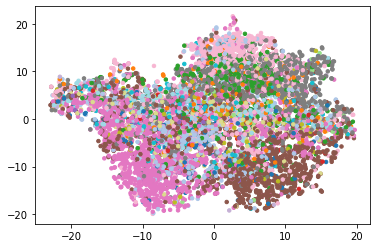

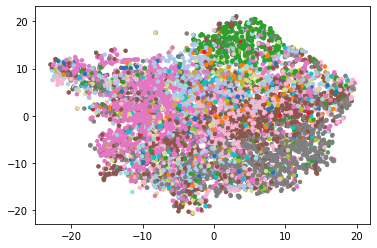

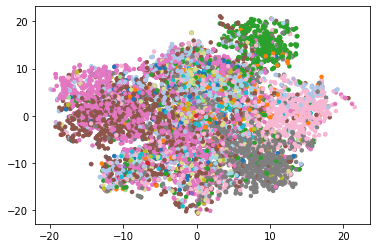

In [36]:
col = list_personality
plt.figure(0)
plt.scatter(X_tsne[:,0], X_tsne[:,1], c=col, cmap=plt.get_cmap('tab20') , s=12)
plt.figure(1)
plt.scatter(X_tsne[:,0], X_tsne[:,2], c=col, cmap=plt.get_cmap('tab20') , s=12)
plt.figure(2)
plt.scatter(X_tsne[:,1], X_tsne[:,2], c=col, cmap=plt.get_cmap('tab20') , s=12)
#legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

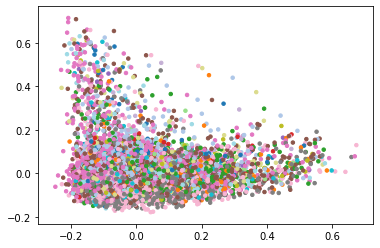

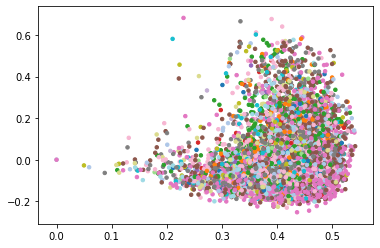

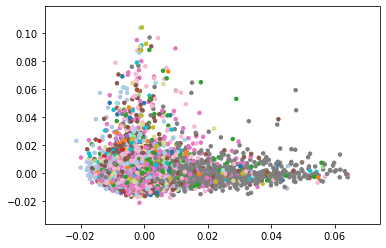

In [37]:
from sklearn.decomposition import KernelPCA, FastICA, PCA
from sklearn.preprocessing import StandardScaler

# PCA
pca_vec = PCA(n_components=12).fit_transform(X_tfidf)

# ICA
ica_vec = FastICA(n_components=12).fit_transform(X_tfidf)

# Plot
plt.figure(1)
plt.scatter(pca_vec[:,0], pca_vec[:,1], c=list_personality, cmap=plt.get_cmap('tab20'), s=12)
plt.figure(2)
plt.scatter(svd_vec[:,0], svd_vec[:,1], c=list_personality, cmap=plt.get_cmap('tab20'), s=12)
plt.figure(3)
plt.scatter(ica_vec[:,0], ica_vec[:,1], c=list_personality, cmap=plt.get_cmap('tab20'), s=12)

In [38]:
# Split mbti personality into 4 letters and binarize
titles = ["Extraversion (E) - Introversion (I)",
          "Sensation (S) - INtuition (N)",
          "Thinking (T) - Feeling (F)",
          "Judgement (J) - Perception (P)"
         ] 
b_Pers = {'I':0, 'E':1, 'N':0, 'S':1, 'F':0, 'T':1, 'J':0, 'P':1}
b_Pers_list = [{0:'I', 1:'E'}, {0:'N', 1:'S'}, {0:'F', 1:'T'}, {0:'J', 1:'P'}]

def translate_personality(personality):
    '''
    transform mbti to binary vector
    '''
    return [b_Pers[l] for l in personality]

def translate_back(personality):
    '''
    transform binary vector to mbti personality
    '''
    s = ""
    for i, l in enumerate(personality):
        s += b_Pers_list[i][l]
    return s

list_personality_bin = np.array([translate_personality(p) for p in train.type])
print("Binarize MBTI list: \n%s" % list_personality_bin)

# Plot
def plot_tsne(X, i):
    a = plt.figure(i, figsize=(30,20))
    plt.title(titles[i])
    plt.subplot(3,1,1)
    plt.scatter(X[:,0], X[:,1], c=list_personality_bin[:,i], cmap=plt.get_cmap('Dark2'), s=25)
    plt.subplot(3,1,2)
    plt.scatter(X[:,0], X[:,2], c=list_personality_bin[:,i], cmap=plt.get_cmap('Dark2'), s=25)
    plt.subplot(3,1,3)
    plt.scatter(X[:,1], X[:,2], c=list_personality_bin[:,i], cmap=plt.get_cmap('Dark2'), s=25)

Binarize MBTI list: 
[[0 0 0 0]
 [1 0 1 1]
 [0 0 1 1]
 ...
 [0 0 1 1]
 [0 0 0 1]
 [0 0 0 1]]


In [39]:
# Confusion plot
from sklearn.metrics import confusion_matrix
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Confusion matrix")
    else:
        print('Confusion matrix, without normalization')
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [40]:
##### Sklearn classifiers

from sklearn.linear_model import SGDClassifier, PassiveAggressiveClassifier
from sklearn.svm import LinearSVC, NuSVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, f1_score
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer, TfidfTransformer

import xgboost as xgb
import pickle

# Vectorizer

cntizer = CountVectorizer(analyzer="word", 
                             max_features=1000, 
                             tokenizer=None,    
                             preprocessor=None, 
                             stop_words=None,   
                             max_df=0.5,
                             min_df=0.1) 

tfizer = TfidfTransformer()

# Classifiers
PassAgg = PassiveAggressiveClassifier(max_iter=50)

sgd = SGDClassifier(loss='hinge',   
              penalty='l1',   
              alpha=1e-2,     
              random_state=42,
              max_iter=7,     
              tol=None)

# SVM
lsvc = LinearSVC()

# Multinomial Naive Bayes
mlNB = MultinomialNB()

# Xgboost 
# setup parameters for xgboost
param = {}

# use softmax multi-class classification
param['objective'] = 'multi:softprob'
# scale weight of positive examples
param['eta'] = 0.6
param['ntrees'] = 300
param['subsample'] = 0.93
param['max_depth'] = 2
param['silent'] = 1
param['n_jobs'] = 8
param['num_class'] = len(unique_type_list)
xgb_class = xgb.XGBClassifier(**param)

In [41]:
list_personality

array([ 8,  3, 11, ..., 11,  9,  9])

In [42]:
type(list_posts)

numpy.ndarray

In [43]:
# Train with k fold stratified validation

from sklearn.model_selection import StratifiedKFold, StratifiedShuffleSplit

name = lambda x : str(x).split('(')[0]

def train_stratified(models, X, y, add_idf=False, nsplits=3, confusion=False):
    '''
    Take a sklearn model like, feature set X, target set y and number of splits to compute Stratified kfold validation.
    Args:
        X (array):       Numpy array of features.
        y (str):         Target - Personality list.
        add_idf (bool):  Wehther to use tf-idf on CountVectorizer.
        nsplits(int):    Number of splits for cross validation.
        confusion(bool): Wether to plot confusion matrix 
        
    Returns:
        dict: Dictionnary of classifiers and their cv f1-score.
    '''
    fig_i = 0
    kf = StratifiedShuffleSplit(n_splits=nsplits)
    
    # Store fold score for each classifier in a dictionnary
    dico_score = {}
    dico_score['merged'] = 0
    for model in models:
        dico_score[name(model)] = 0
    
    # Stratified Split
    for train, test in kf.split(X,y):
        X_train, X_test, y_train, y_test = X[train], X[test], y[train], y[test]
        
        X_train = cntizer.fit_transform(X_train)
        X_test = cntizer.transform(X_test)
        
        # tf-idf
        if add_idf == True:
            X_train_tfidf = tfizer.fit_transform(X_train_cnt)
            X_test_tfidf = tfizer.transform(X_test_cnt)
        
            X_train = np.column_stack((X_train_tfidf.todense(), X_train))
            X_test = np.column_stack((X_test_tfidf.todense(), X_test))
        
        probs = np.ones((len(y_test), 16))
        for model in models:
            # if xgboost use dmatrix
            if 'XGB' in name(model):
                xg_train = xgb.DMatrix(X_train, label=y_train)
                xg_test = xgb.DMatrix(X_test, label=y_test)
                watchlist = [(xg_train, 'train'), (xg_test, 'test')]
                num_round = 30
                bst = xgb.train(param, xg_train, num_round, watchlist, early_stopping_rounds=6)
                preds = bst.predict(xg_test)
                probs = np.multiply(probs, preds)
                preds = np.array([np.argmax(prob) for prob in preds])
            else:
                model.fit(X_train, y_train)
                preds = model.predict(X_test)
                probs = np.multiply(probs, model.predict_proba(X_test))
            # f1-score
            score = f1_score(y_test, preds, average='weighted')
            dico_score[name(model)] += score
            print('%s : %s' % (str(model).split('(')[0], score))
            
            if confusion == True:
                # Compute confusion matrix
                cnf_matrix = confusion_matrix(y_test, preds)
                np.set_printoptions(precision=2)
                # Plot confusion matrix
                plt.figure(fig_i)
                fig_i += 1
                plot_confusion_matrix(cnf_matrix, classes=lab_encoder.inverse_transform(range(16)), normalize=True,
                                                          title=('Confusion matrix %s' % name(model)))
        
        # product of class probabilites of each classifier 
        merged_preds = [np.argmax(prob) for prob in probs]
        score = f1_score(y_test, merged_preds, average='weighted')
        print('Merged score: %s' % score)
        dico_score['merged'] += score
        
    return {k: v / nsplits for k, v in dico_score.items()}

[16:04:15] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:480: 
Parameters: { ntrees, silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-merror:0.40079	test-merror:0.42166
Multiple eval metrics have been passed: 'test-merror' will be used for early stopping.

Will train until test-merror hasn't improved in 6 rounds.
[1]	train-merror:0.38158	test-merror:0.39631
[2]	train-merror:0.36429	test-merror:0.39747
[3]	train-merror:0.35391	test-merror:0.37558
[4]	train-merror:0.34226	test-merror:0.37097
[5]	train-merror:0.33893	test-merror:0.36290
[6]	train-merror:0.32842	test-merror:0.35253
[7]	train-merror:0.32497	test-merror:0.35829
[8]	train-merror:0.31971	test-merror:0.35138
[9]	train-merror:0.31613	test-merror:0.34332
[10]	train-merror:0.30972	test-merror:0.

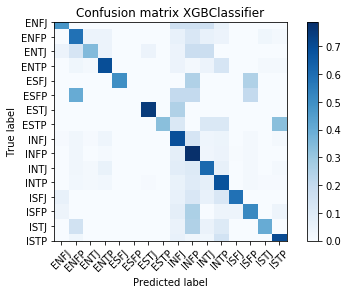

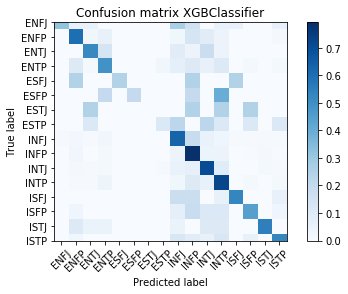

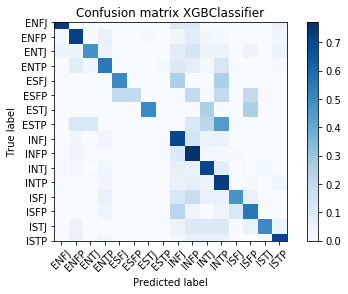

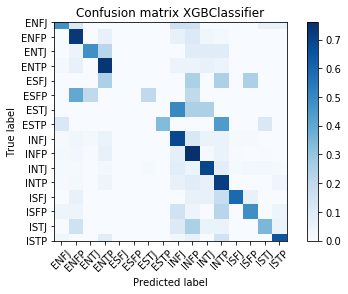

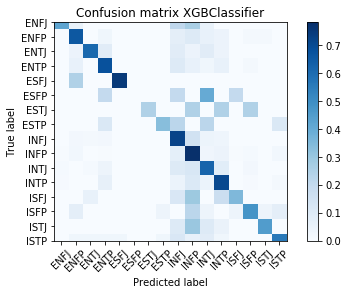

In [44]:
#results = train_stratified([mlNB, xgb_class], list_posts, list_personality, add_idf=False, nsplits=5, confusion=True)
results = train_stratified([xgb_class], list_posts, list_personality, add_idf=False, nsplits=5, confusion=True)

In [45]:
results

{'merged': 0.6562087664248705, 'XGBClassifier': 0.6562087664248705}

In [46]:
list_posts[1]

' finding lack post alarming sex boring position often example girlfriend currently environment creatively use cowgirl missionary enough giving new meaning game theory hello entp grin take converse flirting acknowledge presence return word smooth wordplay cheeky grin lack balance hand eye coordination real iq test score internet iq test funny score higher like former response thread mention believe iq test banish know entp vanish site year half return find people still commenting post liking idea thought know entp link link think thing sometimes go old sherlock holmes quote perhaps man special knowledge special power like rather encourages seek complex cheshirewolf tumblr com post really never thought e j p real function judge use use ne ti dominates fe emotion rarely si also use ni due strength know though ingenious saying really want try see happens playing first person shooter back drive around want see look rock paper one best make lol guy lucky really high tumblr system hear new f

In [64]:
list_personality

array([ 8,  3, 11, ..., 11,  9,  9])

In [ ]:
numWords = [len(frase.split()) for frase in list_posts[1]]
print(sum(numWords))

In [65]:
len(unique_type_list)

16

In [ ]:
num_words = [len(sentence.split()) for sentence in mylist]
